In [1]:
# Import libraries

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pylab import rcParams
import umap
rcParams['figure.figsize'] = 25, 15

# для моделирования воспользуемся sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
import plotly.graph_objs as go


%matplotlib inline

In [2]:
'''
В этом ноутбуке я проведу EDA, Scaling & Dimensionality Reduction. Посмотрим на разные графики.
'''

'\nВ этом ноутбуке я проведу EDA, Scaling & Dimensionality Reduction. Посмотрим на разные графики.\n'

In [3]:
# функция для выводя двумерных графиков без кластеризации
def make_2D_plot(dataframe,  plot_name='*******', xaxis=0, yaxis=1):
    sns.set(rc={"figure.figsize":( 15, 8 )})
    fig = sns.scatterplot(x=dataframe[:,xaxis], y=dataframe[:,yaxis]).set(title=plot_name)
    return fig

In [4]:
# Функция для скалирования и инвертирования
def make_scale(dataframe, inv=0):
    scaler = StandardScaler()
    scaled = scaler.fit_transform(dataframe)
    if inv == 0:
        return scaled
    elif inv == 1:
        inversed = scaler.inverse_transform(scaled)
        return inversed

In [5]:
# Функция для преобразования РСА
def make_PCA(dataframe, n=2):
    converter_pca = PCA(n_components=n, random_state=42)
    return converter_pca.fit_transform(dataframe)

In [6]:
# Функция для преобразования UMAP
def make_UMAP(dataframe, n=2):
    converter_umap = umap.UMAP(n_components=n,random_state=42)
    return converter_umap.fit_transform(dataframe)

In [7]:
# Функция для преобразования tSNE
def make_TSNE(dataframe, n=2):
    tsne = TSNE(n_components=n, random_state=42, n_jobs=-1)
    return tsne.fit_transform(dataframe)

In [8]:
# функция реализации DBSCAN

def make_DBSCAN_2D(dataframe, epsilon=0.5, min_sam=5):
    dbscan = DBSCAN(eps = epsilon, min_samples = min_sam).fit(dataframe)
    db_labels = dbscan.labels_
    plt.scatter(dataframe[:,0], dataframe[:,1], c=db_labels)

    return plt.show()

In [9]:
# функция для выводя трёхмерных графиков с кластеризацией
def Data_Color(i):

    if (i == -1):
        return "white"

    elif (i == 0):
        return "red"
    elif (i == 1):
        return "blue"
    elif (i == 2):
        return "green"
    elif (i == 3):
        return "orange"
    elif (i == 4):
        return "yellow"
    elif (i == 5):
        return "pink"
    elif (i == 6):
        return "purple"

    else:
        return 'violet'

def make_3D_plot_DBSCAN(dataframe, plot_name='*******', epsilon=0.5, min_sam=5):
    dbscan = DBSCAN(eps = epsilon, min_samples = min_sam).fit(dataframe)
    db_labels = dbscan.labels_

    data = dataframe
    fig = go.Scatter3d(x=data[:, 0],
                       y=data[:, 1],
                       z=data[:, 2],
                       marker=dict(opacity=0.9,
                                   reversescale=True,
                                   color=list(map(Data_Color, db_labels)),
                                   size=4
                                   ),
                       line=dict (width=0.02),
                       mode='markers',

                       )


    layout = go.Layout(scene=dict(  xaxis=dict( title="data[0]"),
                                    yaxis=dict( title="data[1]"),
                                    zaxis=dict(title="data[2]")),
                       title=plot_name
                       )

    fig = go.Figure(data=fig, layout=layout)
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    return fig.show()

In [10]:
# функция показывающая метрики гридсёрча, улучшенная версия функции с лекции

def get_scores_and_labels(combinations, dataframe):
    scores = []
    all_labels_list = []

    for i, (eps, num_samples) in enumerate(combinations):
        dbscan = DBSCAN(eps=eps, min_samples=num_samples).fit(dataframe)
        labels = dbscan.labels_
        labels_set = set(labels)
        num_clusters = len(labels_set)
        if -1 in labels_set:
            num_clusters -= 1

        if (num_clusters < 2) or (num_clusters > 50):
            scores.append(-10)
            all_labels_list.append('bad')
            continue

        scores.append(silhouette_score(dataframe, labels))
        all_labels_list.append(labels)

    best_index = np.argmax(scores)
    best_parameters = combinations[best_index]
    best_labels = all_labels_list[best_index]
    best_score = scores[best_index]

    return {'best_epsilon': best_parameters[0],
            'best_min_samples': best_parameters[1],
            'best_labels': best_labels,
            'best_score': best_score}

In [11]:
def make_dendro(dataframe, method='ward'):
    plt.figure(figsize=(20, 10))

    selected_data = dataframe
    clusters = shc.linkage(selected_data,
                           method=method,
                           metric="euclidean"
                           )

    shc.dendrogram(Z=clusters)
    plt.title(f'Customers Dendrogram metod == {method}')
    plt.show()

    return plt.show()

In [12]:
#  функция для выводя двумерных графиков кластеров, построенных методом KMeans
def make_2D_plot_hierarhical(dataframe, n=2, plot_name='******', link='ward'):

    agg = AgglomerativeClustering(n_clusters=n, linkage=link).fit(dataframe)
    labels = agg.labels_

    plt.figure(figsize=(15, 8))

    plt.scatter(dataframe[:,0], dataframe[:,1], c=labels, s=20, cmap='coolwarm')

    plt.title(plot_name)
    plt.xlabel('Количество кластеров')
    plt.ylabel('Коэффициент K-means')

    return plt.show()

In [13]:
# функция для выводя трёхмерных графиков с кластеризацией
def Data_Color(i):

    if (i == -1):
        return "white"

    elif (i == 0):
        return "red"
    elif (i == 1):
        return "blue"
    elif (i == 2):
        return "pink"
    elif (i == 3):
        return "green"
    elif (i == 4):
        return "yellow"
    elif (i == 5):
        return "orange"
    elif (i == 6):
        return "purple"

    else:
        return 'violet'

def make_3D_plot_AGGC(dataframe, plot_name='*******', n=2):


    agg = AgglomerativeClustering(n_clusters=n).fit(dataframe)
    agg_labels = agg.labels_

    data = dataframe
    fig = go.Scatter3d(x=data[:, 0],
                       y=data[:, 1],
                       z=data[:, 2],
                       marker=dict(opacity=0.9,
                                   reversescale=True,
                                   color=list(map(Data_Color, agg_labels)),
                                   size=4
                                   ),
                       line=dict (width=0.02),
                       mode='markers',

                       )

    #Make Plot.ly Layout
    layout = go.Layout(scene=dict(  xaxis=dict( title="data[0]"),
                                    yaxis=dict( title="data[1]"),
                                    zaxis=dict(title="data[2]")),
                       title=plot_name
                       )

    fig = go.Figure(data=fig, layout=layout)
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    return fig.show()

In [14]:
# функция для выводя трёхмерных графиков без кластеризации
def make_3D_plot(dataframe, plot_name='*******'):

    data = dataframe
    fig = go.Scatter3d(x=data[:, 0],
                       y=data[:, 1],
                       z=data[:, 2],
                       marker=dict(opacity=0.9,
                                   reversescale=True,
                                   colorscale='Blues',
                                   size=4
                                   ),
                       line=dict (width=0.02),
                       mode='markers',

                       )

    layout = go.Layout(scene=dict(  xaxis=dict( title="data[0]"),
                                    yaxis=dict( title="data[1]"),
                                    zaxis=dict(title="data[2]")),
                       title=plot_name
                       )

    fig = go.Figure(data=fig, layout=layout)
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    return fig.show()

In [15]:
# функция для выводя трёхмерных графиков без кластеризации
def Data_Color(i):

    if (i == -1):
        return "white"

    elif (i == 1):
        return "red"
    elif (i == 0):
        return "blue"

    else:
        return 'violet'

def make_3D_plot_multycolor(dataframe, plot_name='"red == Anomaly; blue == Normal "'):

    data = dataframe
    fig = go.Scatter3d(x=data.iloc[:, 0],
                       y=data.iloc[:, 1],
                       z=data.iloc[:, 2],
                       marker=dict(opacity=0.9,
                                   reversescale=True,
                                   color=list(map(Data_Color, dataframe['class'])),
                                   size=4
                                   ),
                       line=dict (width=0.02),
                       mode='markers',

                       )

    layout = go.Layout(scene=dict(  xaxis=dict( title="data[0]"),
                                    yaxis=dict( title="data[1]"),
                                    zaxis=dict(title="data[2]")),
                       title=plot_name
                       )

    fig = go.Figure(data=fig, layout=layout)
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    return fig.show()

In [16]:
def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
        sum(outliers), 100*sum(outliers)/len(outliers)))

В этом домашнем задании вам предстоит настроить систему по поиску аномалий в банковских транзакциях. Мало того, что аномальных значений в данных меньше одного процента, так еще и переменные анонимизированные и представляют собой первые 28 главных компонент, полученных после PCA преобразования оригинальных данных (о которых мы ничего не знаем).
Смогут ли бравые unsupervised методы справится с такой задачей? Можно ли работать в таких условиях? Кто подставил кролика Роджера? Ответы на некоторые их этих вопросов вы узнаете после выполнения задания :)

Описание/Пошаговая инструкция выполнения домашнего задания:

    Скачайте датасет с https://www.kaggle.com/mlg-ulb/creditcardfraud#creditcard.csv

    Проведите небольшой EDA (гистограммы и описательные статистики - обязательно).

    Воспользуйтесь процентом аномалий, подсчитанным по переменной Class, как "экспертной оценкой" загрязненности нашего датасета.

    Попробуйте построить различные модели и алгоритмы, разобранные на занятии, используя полученную экспертную оценку для настройки параметров.

    Воспользуйтесь стандартными методами оценки качества бинарной классификации (особенно хорошо подойдёт classification report и confusion matrix), и, используя предсказания моделей и переменную Class, проверьте, действительно ли модели справляются со своей задачей и на сколько хорошо они это делают.

    При помощи tSNE и/или UMAP, постройте сжатое представление исходных данных и проверьте, действительно ли аномалии лежат достаточно далеко от основной массы точек.



# 「 Dataset Loading. 」

In [17]:
outlaw_full =  pd.read_csv('archive(3).zip')

# 「 Часть 1. EDA 」

In [18]:
outlaw_full.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.918649e-15,5.682686e-16,-8.761736e-15,2.811118e-15,-1.552103e-15,2.040130e-15,-1.698953e-15,-1.893285e-16,-3.147640e-15,...,1.473120e-16,8.042109e-16,5.282512e-16,4.456271e-15,1.426896e-15,1.701640e-15,-3.662252e-16,-1.217809e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [19]:
outlaw_full['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

outlayer'ов 0,173%

In [20]:
outlaw_full.info()
'''пропусков нет, все значения цифровые.'''

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

'пропусков нет, все значения цифровые.'

# Lets see, datasets with class 0 and class 1 groups

# Make Dataframe with only Class == 1 & see how 3D plot looks like

In [21]:
outlaw_full_Anomaly_Only = outlaw_full.query('Class == 1') # фильтруем оригинальный датасет по колонке Class отбирая только строки, помеченные 1
# outlaw_full_Anomaly_Only

In [22]:
outlaw_full_Anomaly_Only_scale = make_scale(outlaw_full_Anomaly_Only) # производим скалирование датасета с аномалиями

In [23]:
outlaw_full_Anomaly_Only_scale_TSNE_3 = make_TSNE(outlaw_full_Anomaly_Only_scale, 3) # производим преобразование TSNE в 3 колонки

In [24]:
make_3D_plot(outlaw_full_Anomaly_Only_scale_TSNE_3)

In [25]:
outlaw_full_Anomaly_Only_scale_PCA_3  = make_PCA(outlaw_full_Anomaly_Only_scale, 3) # производим преобразование PCA в 3 колонки

In [26]:
make_3D_plot(outlaw_full_Anomaly_Only_scale_PCA_3)

In [27]:
outlaw_full_Anomaly_Only_scale_UMAP_3 = make_UMAP(outlaw_full_Anomaly_Only_scale, 3) # производим преобразование UMAP в 3 колонки

In [28]:
make_3D_plot(outlaw_full_Anomaly_Only_scale_UMAP_3)

# End of Class == 1 research

# Make Dataframe with only Class == 0 [10000 raws] & see how 3D plot looks like

In [29]:
outlaw_full_Zero = outlaw_full.query('Class == 0') # фильтруем оригинальный датасет по колонке Class отбирая только строки, помеченные 0
outlaw_full_Zero_10_000 = outlaw_full_Zero.sample(n = 10_000, random_state=48) # случайным образом отбираем 10_000 строк
# outlaw_full_Zero_10_000

In [30]:
outlaw_full_Zero_10_000_scale = make_scale(outlaw_full_Zero_10_000) # производим скалирование датасета без аномалий

In [31]:
outlaw_full_Zero_10_000_scale_TSNE_3 = make_TSNE(outlaw_full_Zero_10_000_scale, 3) # производим преобразование TSNE в 3 колонки

In [32]:
make_3D_plot(outlaw_full_Zero_10_000_scale_TSNE_3)

In [33]:
outlaw_full_Zero_10_000_scale_PCA_3  = make_PCA(outlaw_full_Zero_10_000_scale, 3) # производим преобразование РСА в 3 колонки

In [34]:
make_3D_plot(outlaw_full_Zero_10_000_scale_PCA_3)

In [35]:
outlaw_full_Zero_10_000_scale_UMAP_3 = make_UMAP(outlaw_full_Zero_10_000_scale, 3) # производим преобразование UMAP в 3 колонки

In [36]:
make_3D_plot(outlaw_full_Zero_10_000_scale_UMAP_3)

In [37]:
'''соединим теперь датасет с class==1 и датасет с class == 0, получив датасет размерностью  10_492 х 31'''

'соединим теперь датасет с class==1 и датасет с class == 0, получив датасет размерностью  10_492 х 31'

In [38]:
outlaw_full_Anomaly_Only.shape

(492, 31)

In [39]:
outlaw_full_Zero_10_000.shape

(10000, 31)

In [40]:
outlaw_full_prune = pd.merge(outlaw_full_Anomaly_Only, outlaw_full_Zero_10_000, how='outer') # производим объединение датасетов по горизонтали

In [41]:
outlaw_full_prune

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,406.0,-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,...,0.517232,-0.035049,-0.465211,0.320198,0.044519,0.177840,0.261145,-0.143276,0.00,1
1,472.0,-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,...,0.661696,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,529.00,1
2,4462.0,-2.303350,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.562320,-0.399147,-0.238253,...,-0.294166,-0.932391,0.172726,-0.087330,-0.156114,-0.542628,0.039566,-0.153029,239.93,1
3,6986.0,-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,...,0.573574,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,59.00,1
4,7519.0,1.234235,3.019740,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,...,-0.379068,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,1.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10487,149948.0,-9.461881,-3.540577,-8.597800,0.442538,-14.977977,7.723585,12.344792,-2.453543,0.919083,...,-3.298141,1.049385,0.684788,1.216030,-1.861108,-0.876181,-1.266618,-0.088363,2690.24,0
10488,64928.0,-1.048548,-0.005027,0.690381,-2.171005,0.471860,5.395698,-2.928021,-2.655712,0.533286,...,3.157162,-2.498000,0.125007,1.002849,1.421659,1.159366,0.227000,0.157482,22.50,0
10489,78033.0,1.224456,-0.283322,1.063427,-0.656057,-1.299453,-0.993220,-0.512681,-0.098459,1.680940,...,0.018065,0.338232,-0.004724,0.757006,0.483070,-0.709410,0.099175,0.040277,1.00,0
10490,147049.0,-0.956678,-5.785084,-4.543637,0.827309,-1.264618,-0.857313,2.773897,-1.062408,-1.197835,...,0.864766,-0.727178,-1.654836,-0.513878,-0.048600,0.882859,-0.446313,0.193348,1696.80,0


In [178]:
outlaw_full_prune.to_csv('outlaw_full_prune.csv', index=False) # сохраняем для использования в другом ноутбуке
'''этот датасет далее будет использоваться в других ноутбуках для анализа'''

'этот датасет далее будет использоваться в других ноутбуках для анализа'

In [42]:
"""вычисляем матрицу кореляций, строить и выводить график не имеет смысла по причине нечитаемости из-за размера. """
corrmat = outlaw_full.corr()
cm = corrmat['Class'].sort_values(ascending=True) # это матрица кореляций и в ней есть отрицательные значения
cm_df = pd.DataFrame(cm)
cm_df = abs(cm_df.loc[cm_df.Class < 0]) # это датафрейм, созданый из матрицы кореляции, но отрицательные значения взяты по модулю

In [43]:
cm_df

,Class
V17,0.326481
V14,0.302544
V12,0.260593
V10,0.216883
V16,0.196539
V3,0.192961
V7,0.187257
V18,0.111485
V1,0.101347
V9,0.097733


In [44]:
cm_df.sort_values('Class', ascending=False).head(10).index
high_corr = ['V17', 'V14', 'V12', 'V10', 'V16', 'V3', 'V7', 'V18', 'V1', 'V9'] # это 10 самых сильно скореллированных колонок. переменная на случай, если работать с полным датафреймом будет тяжело

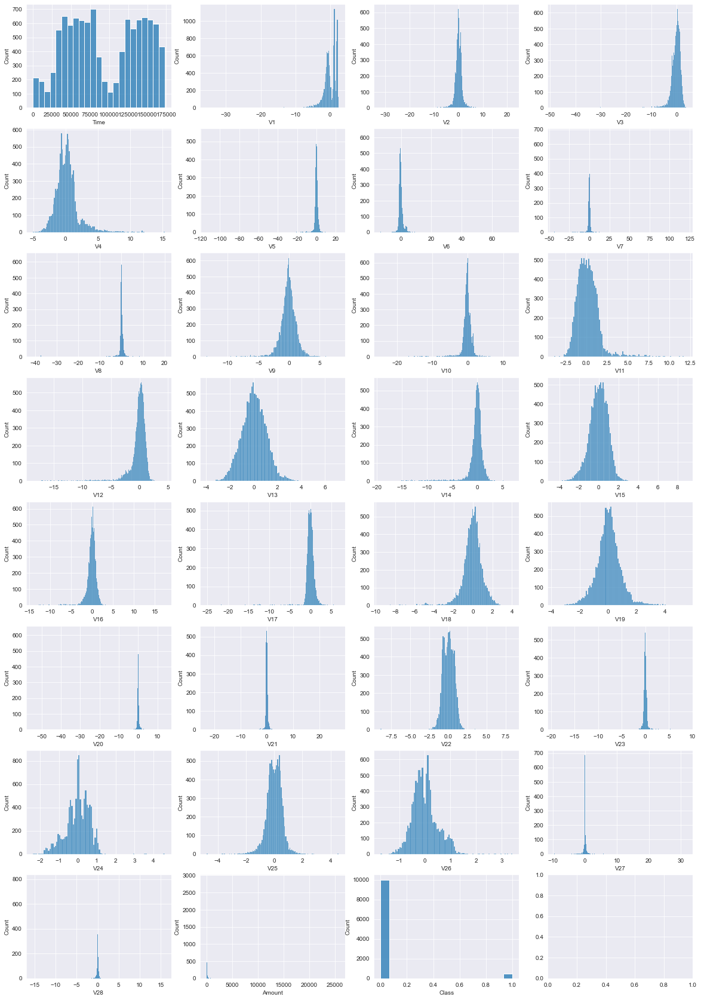

In [45]:
# Вывод гистограмм
fig, axes = plt.subplots(8, 4, figsize=(20, 30))
for ax, column in zip(axes.flat, outlaw_full_prune.columns):
    sns.histplot(outlaw_full_prune.sample(n=outlaw_full_prune.shape[0], random_state=42)[column], ax=ax)

plt.show()

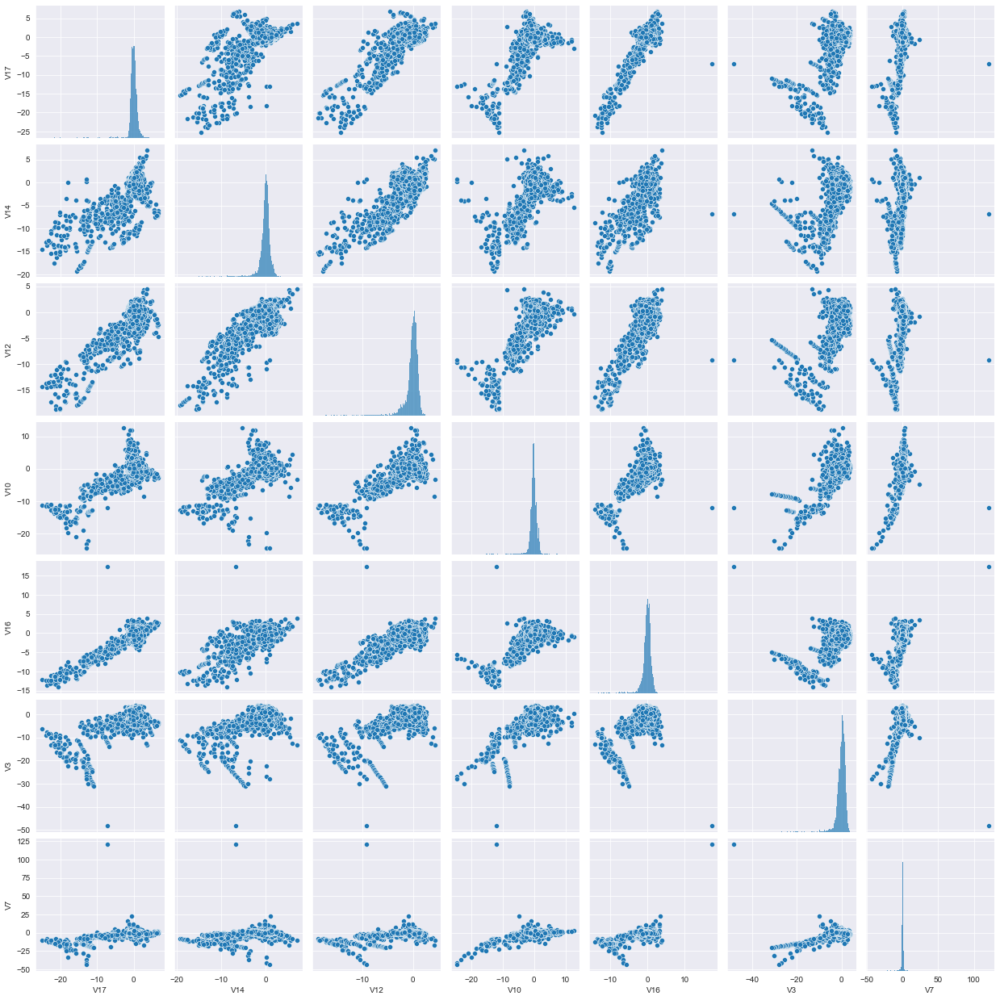

In [46]:
sns.pairplot(outlaw_full_prune[high_corr[:7]])

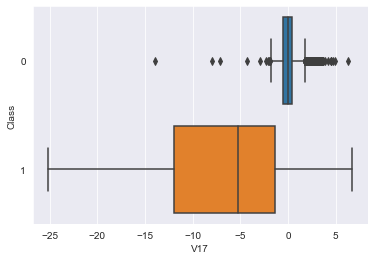

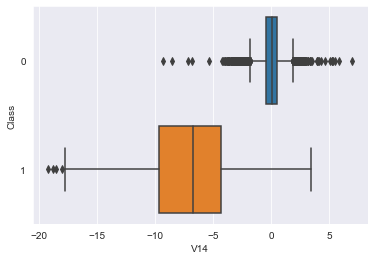

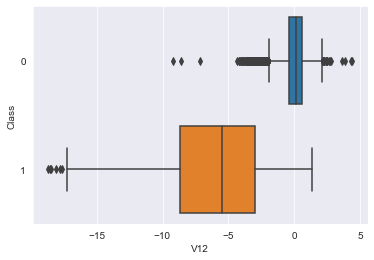

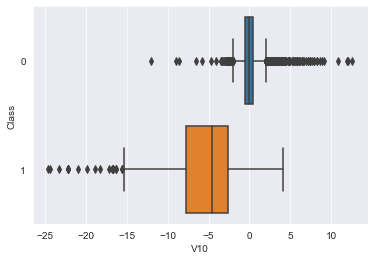

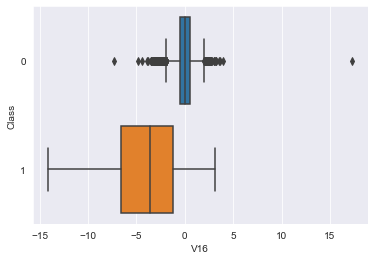

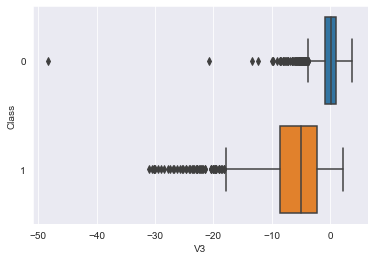

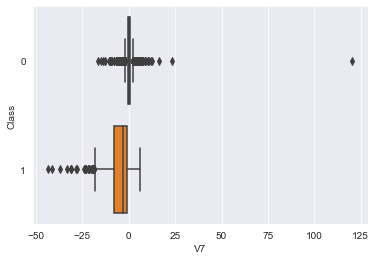

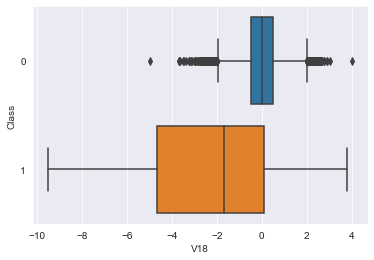

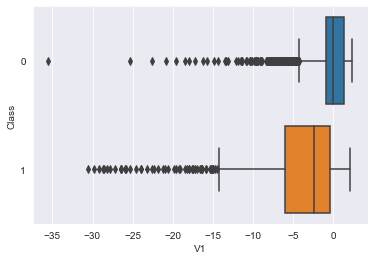

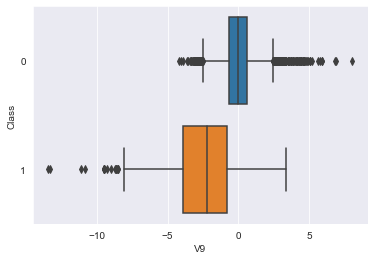

In [47]:
for col in outlaw_full_prune[high_corr]:
    sns.boxplot(data=outlaw_full_prune[high_corr], x=col, y=outlaw_full_prune['Class'], orient='h')
    plt.show()

In [ ]:
# всё в аутлайерах

# <center>  「 outlaw_full_prune scale & data reduction 」 </center>

In [48]:
'''Делаем датасет без колонки Class, затем преобразовываем его с помощью  PCA, TSNE, UMAP, получая отдельные датасеты. и в конце создаём отдельный датасет с колонкой Class '''
outlaw_full_prune_no_Class = outlaw_full_prune.drop('Class', axis=1)
outlaw_full_prune_no_Class_scale = make_scale(outlaw_full_prune_no_Class) #numpy.ndarray

In [49]:
df_outlaw_full_prune_no_Class_scale = pd.DataFrame(outlaw_full_prune_no_Class_scale)
df_outlaw_full_prune_no_Class_scale["class"] = outlaw_full_prune["Class"]

In [50]:
# df_outlaw_full_prune_no_Class_scale.to_csv('df_outlaw_full_prune_no_Class_scale.csv', index=False)

In [51]:
outlaw_full_prune_no_Class_scale_TSNE_2 = make_TSNE(outlaw_full_prune_no_Class_scale) #numpy.ndarray
df_outlaw_full_prune_no_Class_scale_TSNE_2= pd.DataFrame(outlaw_full_prune_no_Class_scale_TSNE_2)
df_outlaw_full_prune_no_Class_scale_TSNE_2["class"] = outlaw_full_prune["Class"]

In [52]:
# df_outlaw_full_prune_no_Class_scale_TSNE_2.to_csv('df_outlaw_full_prune_Class_scale_TSNE_2.csv', index=False)

In [53]:
outlaw_full_prune_no_Class_scale_PCA_2 = make_PCA(outlaw_full_prune_no_Class_scale) #numpy.ndarray
df_outlaw_full_prune_no_Class_scale_PCA_2 = pd.DataFrame(outlaw_full_prune_no_Class_scale_PCA_2)
df_outlaw_full_prune_no_Class_scale_PCA_2["class"] = outlaw_full_prune["Class"]

In [54]:
# df_outlaw_full_prune_no_Class_scale_PCA_2.to_csv('df_outlaw_full_prune_Class_scale_pca_2.csv', index=False)

In [55]:
outlaw_full_prune_no_Class_scale_UMAP_2 = make_UMAP(outlaw_full_prune_no_Class_scale) #numpy.ndarray
df_outlaw_full_prune_no_Class_scale_UMAP_2 = pd.DataFrame(outlaw_full_prune_no_Class_scale_UMAP_2)
df_outlaw_full_prune_no_Class_scale_UMAP_2["class"] = outlaw_full_prune["Class"]

In [56]:
# df_outlaw_full_prune_no_Class_scale_UMAP_2.to_csv('df_outlaw_full_prune_Class_scale_UMAP_2.csv', index=False)

In [57]:
outlaw_full_prune_no_Class_scale_TSNE_3 = make_TSNE(outlaw_full_prune_no_Class_scale, 3) #numpy.ndarray
df_outlaw_full_prune_no_Class_scale_TSNE_3= pd.DataFrame(outlaw_full_prune_no_Class_scale_TSNE_3)
df_outlaw_full_prune_no_Class_scale_TSNE_3["class"] = outlaw_full_prune["Class"]

In [58]:
# df_outlaw_full_prune_no_Class_scale_TSNE_3.to_csv('df_outlaw_full_prune_Class_scale_TSNE_3.csv', index=False)

In [59]:
outlaw_full_prune_no_Class_scale_PCA_3  = make_PCA(outlaw_full_prune_no_Class_scale, 3) #numpy.ndarray
df_outlaw_full_prune_no_Class_scale_PCA_3 = pd.DataFrame(outlaw_full_prune_no_Class_scale_PCA_3)
df_outlaw_full_prune_no_Class_scale_PCA_3["class"] = outlaw_full_prune["Class"]

In [60]:
# df_outlaw_full_prune_no_Class_scale_PCA_3.to_csv('df_outlaw_full_prune_Class_scale_pca_3.csv', index=False)

In [61]:
outlaw_full_prune_no_Class_scale_UMAP_3 = make_UMAP(outlaw_full_prune_no_Class_scale, 3) #numpy.ndarray
df_outlaw_full_prune_no_Class_scale_UMAP_3 = pd.DataFrame(outlaw_full_prune_no_Class_scale_UMAP_3)
df_outlaw_full_prune_no_Class_scale_UMAP_3["class"] = outlaw_full_prune["Class"]

In [62]:
# df_outlaw_full_prune_no_Class_scale_UMAP_3.to_csv('df_outlaw_full_prune_Class_scale_UMAP_3.csv', index=False)

# <center> 「 End of outlaw_full_prune scale & data reduction 」 </center>

In [63]:
'''давайте посмотрим, что покажут 3d графики'''

'давайте посмотрим, что покажут 3d графики'

In [64]:
make_3D_plot_multycolor(df_outlaw_full_prune_no_Class_scale_PCA_3)

In [65]:
make_3D_plot_multycolor(df_outlaw_full_prune_no_Class_scale_TSNE_3)

In [66]:
make_3D_plot_multycolor(df_outlaw_full_prune_no_Class_scale_UMAP_3)

In [67]:
""" отличо, РСА очень явно демонстрирует разделение на аномальные и нормальные данные"""

' отличо, РСА очень явно демонстрирует разделение на аномальные и нормальные данные'

In [68]:
'''оценим ситуацию на 2D графиках'''

'оценим ситуацию на 2D графиках'

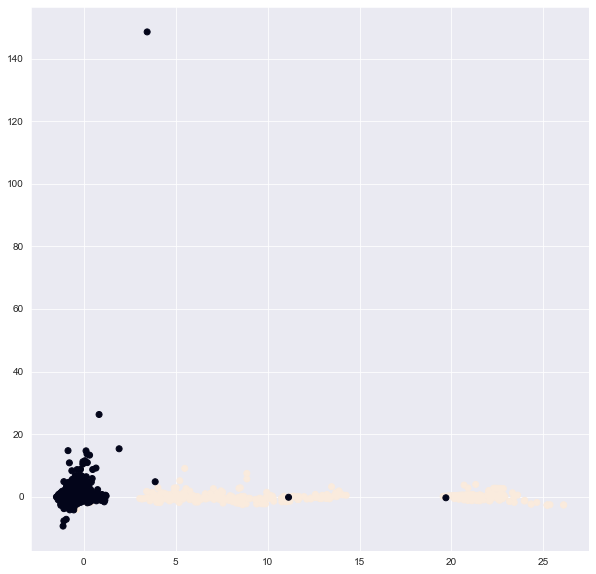

In [69]:
plt.figure(figsize=(10, 10))
plt.scatter(df_outlaw_full_prune_no_Class_scale_PCA_2[0], df_outlaw_full_prune_no_Class_scale_PCA_2[1], c=df_outlaw_full_prune_no_Class_scale_PCA_2["class"])

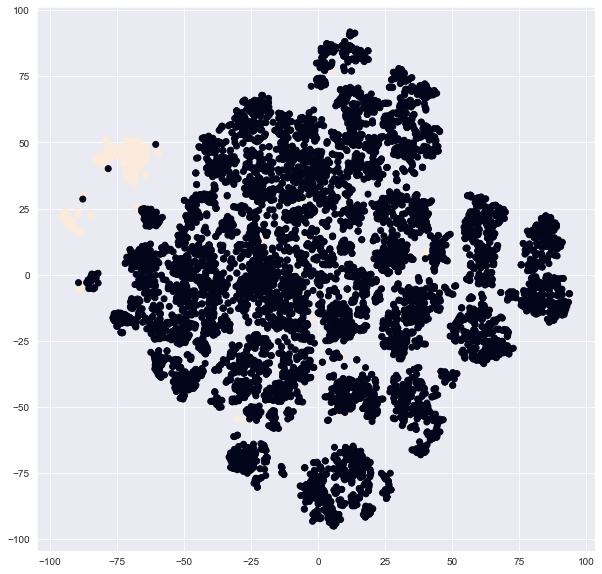

In [70]:
plt.figure(figsize=(10, 10))
plt.scatter(df_outlaw_full_prune_no_Class_scale_TSNE_2[0], df_outlaw_full_prune_no_Class_scale_TSNE_2[1], c=df_outlaw_full_prune_no_Class_scale_TSNE_2["class"])

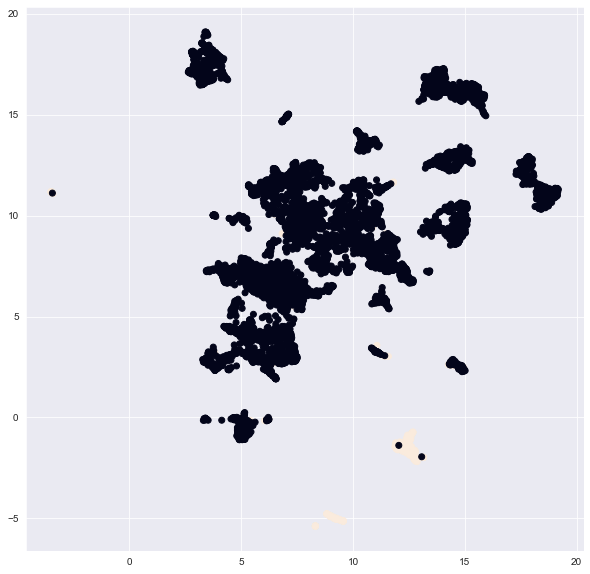

In [71]:
plt.figure(figsize=(10, 10))
plt.scatter(df_outlaw_full_prune_no_Class_scale_UMAP_2[0], df_outlaw_full_prune_no_Class_scale_UMAP_2[1], c=df_outlaw_full_prune_no_Class_scale_UMAP_2["class"])

In [72]:
''' на 2D графиках так же видно чёткое разделение'''

' на 2D графиках так же видно чёткое разделение'

In [73]:
'''проведём небольшой эксперимент и посмотрим, как можно оптимизировать TSNE и как поменяется после этого график'''

'проведём небольшой эксперимент и посмотрим, как можно оптимизировать TSNE и как поменяется после этого график'

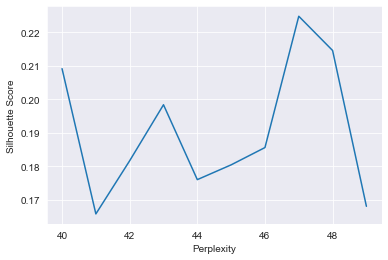

In [81]:
# найдем оптимальное значение для параметра perplexity
perplexities = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
silhouette_scores = []

for p in perplexities:
    tsne = TSNE(perplexity=p)
    X_transformed = tsne.fit_transform(outlaw_full_prune_no_Class_scale)
    score = silhouette_score(X_transformed, outlaw_full_prune["Class"])
    silhouette_scores.append(score)

plt.plot(perplexities, silhouette_scores)
plt.xlabel('Perplexity')
plt.ylabel('Silhouette Score')
plt.show()

In [75]:
# Функция для преобразования TSNE c лучшим параметром perplexity
def make_TSNE_tuned(dataframe, n=2):
    tsne = TSNE(n_components=n, perplexity=50,random_state=42, n_jobs=-1)
    return tsne.fit_transform(dataframe)

In [76]:
outlaw_full_prune_no_Class_scale_TSNE_2_tuned = make_TSNE_tuned(outlaw_full_prune_no_Class_scale)
df_outlaw_full_prune_no_Class_scale_TSNE_2_tuned= pd.DataFrame(outlaw_full_prune_no_Class_scale_TSNE_2_tuned)
df_outlaw_full_prune_no_Class_scale_TSNE_2_tuned["class"] = outlaw_full_prune["Class"]

In [77]:
df_outlaw_full_prune_no_Class_scale_TSNE_2_tuned.to_csv('df_outlaw_full_prune_no_Class_scale_TSNE_2_tuned.csv', index=False)

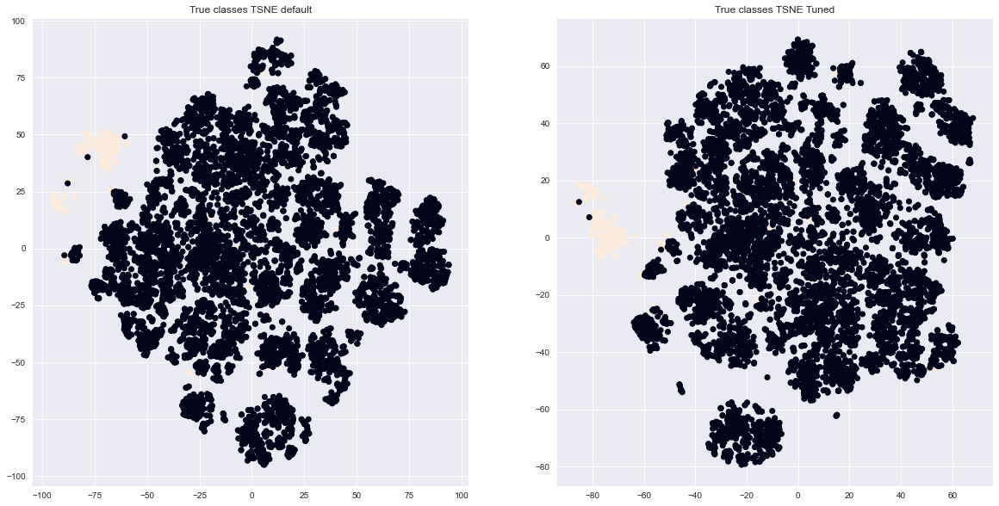

In [78]:
# Сравним на графике TSNE с perplexity со значением по умолчанию и TSNE оптимизированную методом силуэта

def plot_results(true, predicted):
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].scatter(true[0], true[1], c=true['class'])
    ax[0].set_title("True classes TSNE default")
    ax[1].scatter(predicted[0], predicted[1], c=predicted['class'])
    ax[1].set_title("True classes TSNE Tuned")
    plt.show()


plot_results(df_outlaw_full_prune_no_Class_scale_TSNE_2, df_outlaw_full_prune_no_Class_scale_TSNE_2_tuned)

In [1]:
'''отличия есть, аномалии сосредоточились в концентрированный кластер'''

'отличия есть, аномалии сосредоточились в концентрированный кластер'